In [1]:
import pandas as pd

In [2]:
import pandas as pd

# Reading the CSV files into DataFrames with a more suitable encoding
customers_df = pd.read_csv(r'C:\Users\PC\Downloads\PROGRAMS\Global\Customers.csv', encoding='Windows-1252')
sales_df = pd.read_csv(r'C:\Users\PC\Downloads\PROGRAMS\Global\Sales.csv', encoding='utf-8')
stores_df = pd.read_csv(r'C:\Users\PC\Downloads\PROGRAMS\Global\Stores.csv', encoding='utf-8')
products_df = pd.read_csv(r'C:\Users\PC\Downloads\PROGRAMS\Global\Products.csv', encoding='utf-8')
exchange_rates_df = pd.read_csv(r'C:\Users\PC\Downloads\PROGRAMS\Global\Exchange_Rates.csv', encoding='utf-8')


EDA
1) CUSTOMER 
2) SALES
3) STORES
4) PRODUCTS
5) EXCHANGE RATES

In [3]:
#customer file
customers_df.head()

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,7/3/1939
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,9/27/1979
2,554,Female,Claire Ferres,WINJALLOK,VIC,Victoria,3380,Australia,Australia,5/26/1947
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,SA,South Australia,5223,Australia,Australia,9/17/1957
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,VIC,Victoria,3698,Australia,Australia,11/19/1965


In [4]:
customers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15266 entries, 0 to 15265
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   CustomerKey  15266 non-null  int64 
 1   Gender       15266 non-null  object
 2   Name         15266 non-null  object
 3   City         15266 non-null  object
 4   State Code   15256 non-null  object
 5   State        15266 non-null  object
 6   Zip Code     15266 non-null  object
 7   Country      15266 non-null  object
 8   Continent    15266 non-null  object
 9   Birthday     15266 non-null  object
dtypes: int64(1), object(9)
memory usage: 1.2+ MB


1) Birthday date has to be changed into date
2) check for null values
3) state code as 10 null values check it and slove it
4) Napoli code as NAN so we have to change as NA because it show as null values
5) Erase space in between the columns name
6) checking duplicate values

In [5]:
customers_df['Birthday'] = pd.to_datetime(customers_df['Birthday'], format='%m/%d/%Y')

In [6]:
customers_df.isnull().sum()

CustomerKey     0
Gender          0
Name            0
City            0
State Code     10
State           0
Zip Code        0
Country         0
Continent       0
Birthday        0
dtype: int64

In [8]:
customers_df[customers_df.isnull().any(axis=1)]

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday
5304,729681,Female,Rossana Padovesi,Polvica,NaN,Napoli,80035,Italy,Europe,1981-04-18
5316,732289,Male,Indro Piccio,Varcaturo,NaN,Napoli,80014,Italy,Europe,1949-02-24
5372,742042,Male,Amaranto Loggia,Casaferro,NaN,Napoli,80034,Italy,Europe,1936-03-14
5377,742886,Female,Edmonda Capon,Terzigno,NaN,Napoli,80040,Italy,Europe,1963-08-06
5378,743343,Female,Ambra Sagese,Pomigliano D'Arco,NaN,Napoli,80038,Italy,Europe,1961-01-05
5485,759705,Male,Callisto Lo Duca,Casilli,NaN,Napoli,80047,Italy,Europe,1976-08-28
5525,765589,Male,Michelino Lucchesi,Pompei Scavi,NaN,Napoli,80045,Italy,Europe,1947-11-13
5531,766410,Male,Adelmio Beneventi,Licola,NaN,Napoli,80078,Italy,Europe,1940-01-13
5631,781667,Female,Ilda Manna,Napoli,NaN,Napoli,80134,Italy,Europe,1977-05-08
5695,789177,Male,Calogero Folliero,Mariglianella,NaN,Napoli,80030,Italy,Europe,2000-03-03


In [9]:
customers_df.fillna('NA', inplace=True)

In [10]:
customers_df.columns.str.replace(' ','')

Index(['CustomerKey', 'Gender', 'Name', 'City', 'StateCode', 'State',
       'ZipCode', 'Country', 'Continent', 'Birthday'],
      dtype='object')

In [11]:
customers_df.duplicated().sum()

np.int64(0)

In [12]:
customers_df.isnull().sum()

CustomerKey    0
Gender         0
Name           0
City           0
State Code     0
State          0
Zip Code       0
Country        0
Continent      0
Birthday       0
dtype: int64

SALES FILE

In [13]:
sales_df.head()

,Order Number,Line Item,Order Date,Delivery Date,CustomerKey,StoreKey,ProductKey,Quantity,Currency Code
0,366000,1,1/1/2016,NaN,265598,10,1304,1,CAD
1,366001,1,1/1/2016,1/13/2016,1269051,0,1048,2,USD
2,366001,2,1/1/2016,1/13/2016,1269051,0,2007,1,USD
3,366002,1,1/1/2016,1/12/2016,266019,0,1106,7,CAD
4,366002,2,1/1/2016,1/12/2016,266019,0,373,1,CAD


1) check null values
2) remove the spaces between the columns name
3) change the delivery date and order date into datetime data type
4) check for any duplicate values
5) Null values in DeliveryDate 

In [14]:
sales_df.isnull().sum()

Order Number         0
Line Item            0
Order Date           0
Delivery Date    49719
CustomerKey          0
StoreKey             0
ProductKey           0
Quantity             0
Currency Code        0
dtype: int64

In [15]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62884 entries, 0 to 62883
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Order Number   62884 non-null  int64 
 1   Line Item      62884 non-null  int64 
 2   Order Date     62884 non-null  object
 3   Delivery Date  13165 non-null  object
 4   CustomerKey    62884 non-null  int64 
 5   StoreKey       62884 non-null  int64 
 6   ProductKey     62884 non-null  int64 
 7   Quantity       62884 non-null  int64 
 8   Currency Code  62884 non-null  object
dtypes: int64(6), object(3)
memory usage: 4.3+ MB


In [16]:
sales_df.columns= sales_df.columns.str.replace(' ','')

In [17]:
sales_df.describe()

,OrderNumber,LineItem,CustomerKey,StoreKey,ProductKey,Quantity
count,6.288400e+04,62884.000000,6.288400e+04,62884.000000,62884.000000,62884.000000
mean,1.430905e+06,2.164207,1.180797e+06,31.802144,1125.859344,3.144790
std,4.532963e+05,1.365170,5.859634e+05,22.978188,709.244010,2.256371
min,3.660000e+05,1.000000,3.010000e+02,0.000000,1.000000,1.000000
25%,1.121017e+06,1.000000,6.808580e+05,8.000000,437.000000,1.000000
50%,1.498016e+06,2.000000,1.261200e+06,37.000000,1358.000000,2.000000
75%,1.788010e+06,3.000000,1.686496e+06,53.000000,1650.000000,4.000000
max,2.243032e+06,7.000000,2.099937e+06,66.000000,2517.000000,10.000000


In [18]:
sales_df['DeliveryDate'] = pd.to_datetime(sales_df['DeliveryDate'], errors='coerce')
sales_df['OrderDate'] = pd.to_datetime(sales_df['OrderDate'])

In [19]:
sales_df.loc[sales_df['DeliveryDate'].isna() & (sales_df['StoreKey'] != 0),'DeliveryDate'] = sales_df['OrderDate']

In [20]:
sales_df.isnull().sum()

OrderNumber     0
LineItem        0
OrderDate       0
DeliveryDate    0
CustomerKey     0
StoreKey        0
ProductKey      0
Quantity        0
CurrencyCode    0
dtype: int64

STORES FILE

1) check for null values
2) Null values are changed into zero
3) remove the spaces between the columns name
4) Change the data type of order date into date and time

In [21]:
stores_df.head()

,StoreKey,Country,State,Square Meters,Open Date
0,1,Australia,Australian Capital Territory,595.0,1/1/2008
1,2,Australia,Northern Territory,665.0,1/12/2008
2,3,Australia,South Australia,2000.0,1/7/2012
3,4,Australia,Tasmania,2000.0,1/1/2010
4,5,Australia,Victoria,2000.0,12/9/2015


In [22]:
stores_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67 entries, 0 to 66
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   StoreKey       67 non-null     int64  
 1   Country        67 non-null     object 
 2   State          67 non-null     object 
 3   Square Meters  66 non-null     float64
 4   Open Date      67 non-null     object 
dtypes: float64(1), int64(1), object(3)
memory usage: 2.7+ KB


In [23]:
stores_df.describe()

,StoreKey,Square Meters
count,67.000000,66.000000
mean,33.000000,1402.196970
std,19.485037,576.404058
min,0.000000,245.000000
25%,16.500000,1108.750000
50%,33.000000,1347.500000
75%,49.500000,2000.000000
max,66.000000,2105.000000


In [24]:
stores_df.isna().sum()

StoreKey         0
Country          0
State            0
Square Meters    1
Open Date        0
dtype: int64

In [25]:
stores_df.fillna(0,inplace=True)

In [26]:
stores_df.columns =stores_df.columns.str.replace(' ','')

In [27]:
stores_df['OpenDate'] = pd.to_datetime(stores_df['OpenDate'])

In [28]:
stores_df.isnull().sum()

StoreKey        0
Country         0
State           0
SquareMeters    0
OpenDate        0
dtype: int64

PRODUCT FILE

1) check null values
2) check duplicate value
3) remove the spaces between the columns name
4) convert Unit price usd and unit cost usd into float  and remove the $ symbol

In [29]:
products_df.head()

,ProductKey,Product Name,Brand,Color,Unit Cost USD,Unit Price USD,SubcategoryKey,Subcategory,CategoryKey,Category
0,1,Contoso 512MB MP3 Player E51 Silver,Contoso,Silver,$6.62,$12.99,101,MP4&MP3,1,Audio
1,2,Contoso 512MB MP3 Player E51 Blue,Contoso,Blue,$6.62,$12.99,101,MP4&MP3,1,Audio
2,3,Contoso 1G MP3 Player E100 White,Contoso,White,$7.40,$14.52,101,MP4&MP3,1,Audio
3,4,Contoso 2G MP3 Player E200 Silver,Contoso,Silver,$11.00,$21.57,101,MP4&MP3,1,Audio
4,5,Contoso 2G MP3 Player E200 Red,Contoso,Red,$11.00,$21.57,101,MP4&MP3,1,Audio


In [30]:
products_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   ProductKey      2517 non-null   int64 
 1   Product Name    2517 non-null   object
 2   Brand           2517 non-null   object
 3   Color           2517 non-null   object
 4   Unit Cost USD   2517 non-null   object
 5   Unit Price USD  2517 non-null   object
 6   SubcategoryKey  2517 non-null   int64 
 7   Subcategory     2517 non-null   object
 8   CategoryKey     2517 non-null   int64 
 9   Category        2517 non-null   object
dtypes: int64(3), object(7)
memory usage: 196.8+ KB


In [31]:
products_df.isna().sum()

ProductKey        0
Product Name      0
Brand             0
Color             0
Unit Cost USD     0
Unit Price USD    0
SubcategoryKey    0
Subcategory       0
CategoryKey       0
Category          0
dtype: int64

In [32]:
products_df.duplicated().sum()

np.int64(0)

In [33]:
products_df.columns = products_df.columns.str.replace(' ','')

In [34]:
products_df['UnitCostUSD'] = products_df['UnitCostUSD'].str.replace(r'[\$,]', '', regex=True).astype(float)
products_df['UnitPriceUSD'] = products_df['UnitPriceUSD'].str.replace(r'[\$,]', '', regex=True).astype(float)

Exchange Rates File

1) check null values
2) convert date's data type into date and time
3) check duplicate values

In [35]:
exchange_rates_df.head()

,Date,Currency,Exchange
0,1/1/2015,USD,1.0000
1,1/1/2015,CAD,1.1583
2,1/1/2015,AUD,1.2214
3,1/1/2015,EUR,0.8237
4,1/1/2015,GBP,0.6415


In [36]:
exchange_rates_df.isnull().sum()

Date        0
Currency    0
Exchange    0
dtype: int64

In [37]:
exchange_rates_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11215 entries, 0 to 11214
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Date      11215 non-null  object 
 1   Currency  11215 non-null  object 
 2   Exchange  11215 non-null  float64
dtypes: float64(1), object(2)
memory usage: 263.0+ KB


In [38]:
exchange_rates_df['Date'] = pd.to_datetime(exchange_rates_df['Date'], format='%m/%d/%Y')

In [39]:
exchange_rates_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11215 entries, 0 to 11214
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Date      11215 non-null  datetime64[ns]
 1   Currency  11215 non-null  object        
 2   Exchange  11215 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 263.0+ KB


Calculating birthday, age range and store age

In [40]:
from datetime import datetime
def calculate_age(birthday):
    today = datetime.now()
    age = today.year - birthday.year - ((today.month, today.day) <   (birthday.month,birthday.day))
    return age

#creating copy as we would need original cleaning data

customers_df_copy = customers_df
customers_df_copy['Age'] = customers_df_copy['Birthday'].apply(calculate_age)
def agerange(age):
    if age < 10:
        return 'Under 10'
    elif age < 20:
        return '10-19'
    elif age < 30:
        return '20-29'
    elif age < 40:
        return '30-39'
    elif age < 50:
        return '40-49'
    elif age < 60:
        return '50-59'
    else:
        return '60 and above'
    

customers_df_copy['AgeRange'] = customers_df_copy['Age'].apply(agerange)
stores_df_copy = stores_df
stores_df_copy['StoreAge'] = stores_df_copy['OpenDate'].apply(calculate_age)

In [41]:
customers_df_copy.head()

,CustomerKey,Gender,Name,City,State Code,State,Zip Code,Country,Continent,Birthday,Age,AgeRange
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,1939-07-03,85,60 and above
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,1979-09-27,44,40-49
2,554,Female,Claire Ferres,WINJALLOK,VIC,Victoria,3380,Australia,Australia,1947-05-26,77,60 and above
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,SA,South Australia,5223,Australia,Australia,1957-09-17,66,60 and above
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,VIC,Victoria,3698,Australia,Australia,1965-11-19,58,50-59


In [42]:
stores_df_copy.head()

,StoreKey,Country,State,SquareMeters,OpenDate,StoreAge
0,1,Australia,Australian Capital Territory,595.0,2008-01-01,16
1,2,Australia,Northern Territory,665.0,2008-01-12,16
2,3,Australia,South Australia,2000.0,2012-01-07,12
3,4,Australia,Tasmania,2000.0,2010-01-01,14
4,5,Australia,Victoria,2000.0,2015-12-09,8


In [43]:
#Renaming columns name
customers_df_copy.rename(columns={
    'City': 'City_customer',
    'StateCode': 'StateCode_customer',
    'State': 'State_customer',
    'ZipCode': 'ZipCode_customer',
    'Country': 'Country_customer',
    'Continent': 'Continent_customer'
}, inplace=True)

stores_df_copy.rename(columns={'Country':'Country_store','State':'State_store'}, inplace=True)

In [44]:
customers_df_copy.head()

,CustomerKey,Gender,Name,City_customer,State Code,State_customer,Zip Code,Country_customer,Continent_customer,Birthday,Age,AgeRange
0,301,Female,Lilly Harding,WANDEARAH EAST,SA,South Australia,5523,Australia,Australia,1939-07-03,85,60 and above
1,325,Female,Madison Hull,MOUNT BUDD,WA,Western Australia,6522,Australia,Australia,1979-09-27,44,40-49
2,554,Female,Claire Ferres,WINJALLOK,VIC,Victoria,3380,Australia,Australia,1947-05-26,77,60 and above
3,786,Male,Jai Poltpalingada,MIDDLE RIVER,SA,South Australia,5223,Australia,Australia,1957-09-17,66,60 and above
4,1042,Male,Aidan Pankhurst,TAWONGA SOUTH,VIC,Victoria,3698,Australia,Australia,1965-11-19,58,50-59


In [45]:
stores_df_copy.head()

,StoreKey,Country_store,State_store,SquareMeters,OpenDate,StoreAge
0,1,Australia,Australian Capital Territory,595.0,2008-01-01,16
1,2,Australia,Northern Territory,665.0,2008-01-12,16
2,3,Australia,South Australia,2000.0,2012-01-07,12
3,4,Australia,Tasmania,2000.0,2010-01-01,14
4,5,Australia,Victoria,2000.0,2015-12-09,8


MERGING DATA

In [46]:
sales_store_df_merged = pd.merge(sales_df, stores_df, on='StoreKey', how='left')
sales_store_df_merged.head()

,OrderNumber,LineItem,OrderDate,DeliveryDate,CustomerKey,StoreKey,ProductKey,Quantity,CurrencyCode,Country_store,State_store,SquareMeters,OpenDate,StoreAge
0,366000,1,2016-01-01,2016-01-01,265598,10,1304,1,CAD,Canada,Nunavut,1210.0,2015-04-04,9
1,366001,1,2016-01-01,2016-01-13,1269051,0,1048,2,USD,Online,Online,0.0,2010-01-01,14
2,366001,2,2016-01-01,2016-01-13,1269051,0,2007,1,USD,Online,Online,0.0,2010-01-01,14
3,366002,1,2016-01-01,2016-01-12,266019,0,1106,7,CAD,Online,Online,0.0,2010-01-01,14
4,366002,2,2016-01-01,2016-01-12,266019,0,373,1,CAD,Online,Online,0.0,2010-01-01,14


In [47]:
sales_store_products_df_merged = pd.merge(sales_store_df_merged, products_df, on='ProductKey', how='left')

In [48]:
sales_store_products_customers_df_merged = pd.merge(sales_store_products_df_merged, customers_df, on='CustomerKey', how='left')

In [50]:
final_merge_df = pd.merge(sales_store_products_customers_df_merged, exchange_rates_df,
                          left_on=['OrderDate','CurrencyCode'],
                          right_on=['Date','Currency'],
                          how='left')

In [51]:
final_merge_df.drop(columns=['Date','Currency'],inplace=True)

In [52]:
final_merge_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62884 entries, 0 to 62883
Data columns (total 35 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   OrderNumber         62884 non-null  int64         
 1   LineItem            62884 non-null  int64         
 2   OrderDate           62884 non-null  datetime64[ns]
 3   DeliveryDate        62884 non-null  datetime64[ns]
 4   CustomerKey         62884 non-null  int64         
 5   StoreKey            62884 non-null  int64         
 6   ProductKey          62884 non-null  int64         
 7   Quantity            62884 non-null  int64         
 8   CurrencyCode        62884 non-null  object        
 9   Country_store       62884 non-null  object        
 10  State_store         62884 non-null  object        
 11  SquareMeters        62884 non-null  float64       
 12  OpenDate            62884 non-null  datetime64[ns]
 13  StoreAge            62884 non-null  int64     

In [53]:
final_merge_df.to_csv('final_merge_df.csv', index=False)

Calculate the revenue

In [62]:
final_merge_df['RevenueUSD'] = final_merge_df['Quantity'] * final_merge_df['UnitPriceUSD']
final_merge_df['ProfitUSD'] = final_merge_df['RevenueUSD'] - (final_merge_df['Quantity'] * final_merge_df['UnitCostUSD'])

In [67]:
#Creating a Frequency Column to the data

# Count the number of orders per customer
order_counts = final_merge_df.groupby('CustomerKey')['OrderNumber'].count()

# function to Categorize frequency
def categorize_frequency(count):
    if count >= 1 and count <= 4:
        return 'Occasional'
    elif count >= 5 and count <= 10:
        return 'Moderate'
    elif count > 10:
        return 'Frequent'
    else:
        return 'Unknown'

# Apply categorization to get a Series of categories
order_counts_category = order_counts.apply(categorize_frequency)

# Merge this frequency information back into the original DataFrame
# Reset index to merge
order_counts_category = order_counts_category.reset_index(name='Frequency')

# Merge with the original DataFrame
final_merge_df = final_merge_df.merge(order_counts_category, on='CustomerKey', how='left')

In [68]:
pd.set_option('display.max_columns', None)
final_merge_df.head(1)

,OrderNumber,LineItem,OrderDate,DeliveryDate,CustomerKey,StoreKey,ProductKey,Quantity,CurrencyCode,Country_store,State_store,SquareMeters,OpenDate,StoreAge,ProductName,Brand,Color,UnitCostUSD,UnitPriceUSD,SubcategoryKey,Subcategory,CategoryKey,Category,Gender,Name,City_customer,State Code,State_customer,Zip Code,Country_customer,Continent_customer,Birthday,Age,AgeRange,Exchange,RevenueUSD,ProfitUSD,Frequency
0,366000,1,2016-01-01,2016-01-01,265598,10,1304,1,CAD,Canada,Nunavut,1210.0,2015-04-04,9,Contoso Lens Adapter M450 White,Contoso,White,31.27,68.0,406,Cameras & Camcorders Accessories,4,Cameras and camcorders,Male,Tyler Vaught,London,ON,Ontario,N5W 5K6,Canada,North America,1971-03-23,53,50-59,1.3884,68.0,36.73,Moderate


DATA VISUALIZATION

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

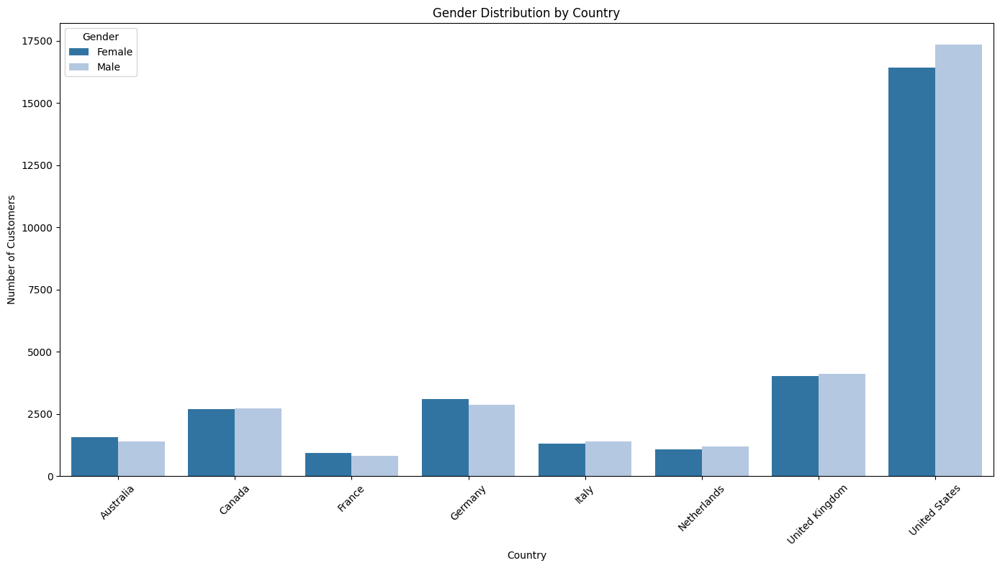

In [69]:
#Plotting total customers gender wise split in country
# Count occurrences of each gender within each country
gender_counts = final_merge_df.groupby(['Country_customer', 'Gender']).size().reset_index(name='Count')

# Plotting gender distribution within each country
plt.figure(figsize=(14, 8))
sns.barplot(data=gender_counts, x='Country_customer', y='Count', hue='Gender',palette='tab20')
plt.title('Gender Distribution by Country')
plt.xlabel('Country')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

No variation in customer distribution , united states has highest number of customers compared to others

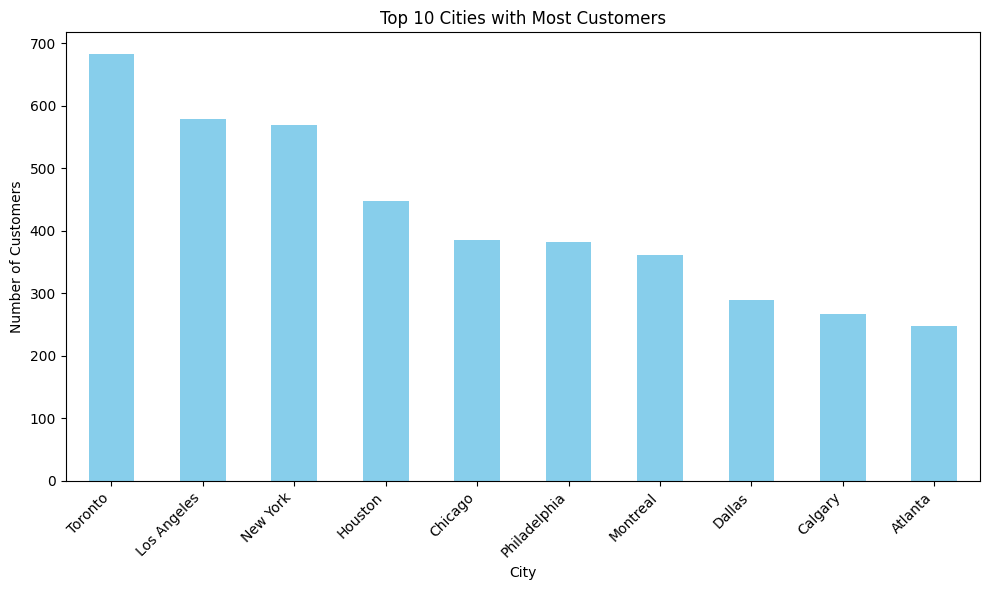

In [70]:
#Finding top 10 City with most customers

customer_counts = final_merge_df['City_customer'].value_counts()

#Geting the top 10 cities
top_10_cities = customer_counts.head(10)

#Plotting the top 10 cities with the most customers
plt.figure(figsize=(10, 6))
top_10_cities.plot(kind='bar', color='skyblue')
plt.xlabel('City')
plt.ylabel('Number of Customers')
plt.title('Top 10 Cities with Most Customers')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # Adjusts plot to fit labels

# Show plot
plt.show()

United states's several cities in USA is the top ten cities with high number of customers. Toronto is Top

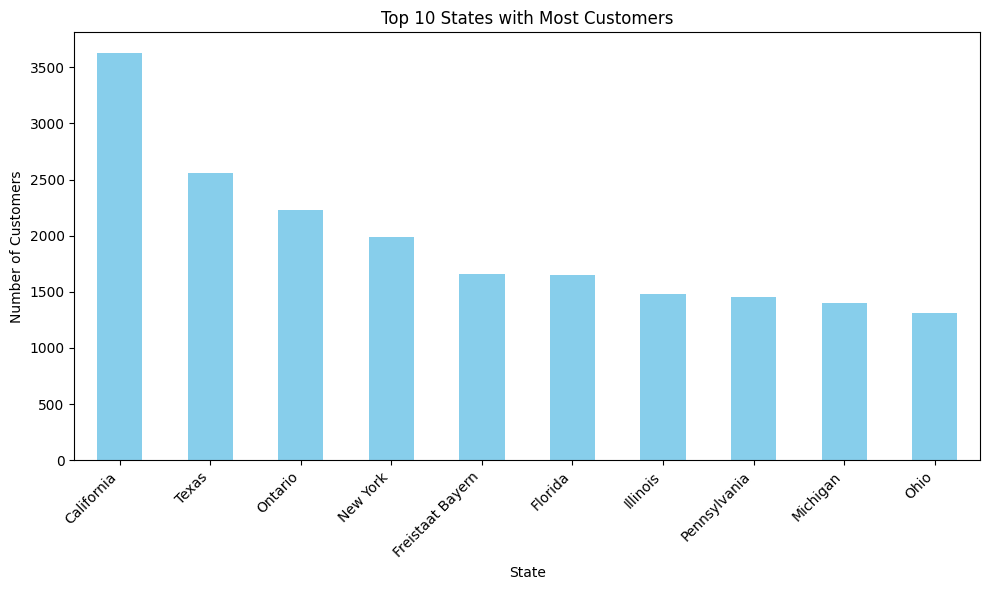

In [71]:
#Top 10 regions statewise for most number of Customers

customer_counts = final_merge_df['State_customer'].value_counts()

#Geting the top 10 states
top_10_states = customer_counts.head(10)

#Plotting the top 10 cities with the most customers
plt.figure(figsize=(10, 6))
top_10_states.plot(kind='bar', color='skyblue')
plt.xlabel('State')
plt.ylabel('Number of Customers')
plt.title('Top 10 States with Most Customers')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # Adjusts plot to fit labels

# Show plot
plt.show()

California is the top 

C:\Users\PC\AppData\Local\Temp\ipykernel_16800\2468286214.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top10_states_profits, x='State_customer', y='ProfitUSD', palette='viridis')


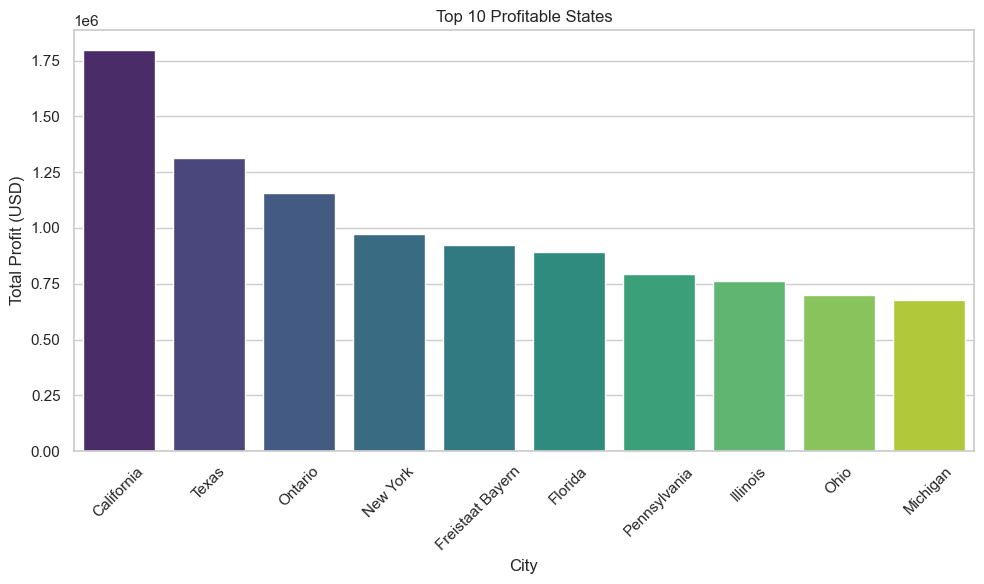

In [72]:
# Calculating profits by State
state_profits = final_merge_df.groupby(['State_customer'])['ProfitUSD'].sum().sort_values(ascending=False)

# Convert to DataFrame for better readability
state_profits_df = state_profits.reset_index()

top10_states_profits = state_profits_df.head(10)

# Set plot style
sns.set(style="whitegrid")

# Create a figure and axis
plt.figure(figsize=(10, 6))

# Create a barplot
sns.barplot(data=top10_states_profits, x='State_customer', y='ProfitUSD', palette='viridis')

# Add labels and title
plt.xlabel('City')
plt.ylabel('Total Profit (USD)')
plt.title('Top 10 Profitable States')
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()

United states as the Strong customers

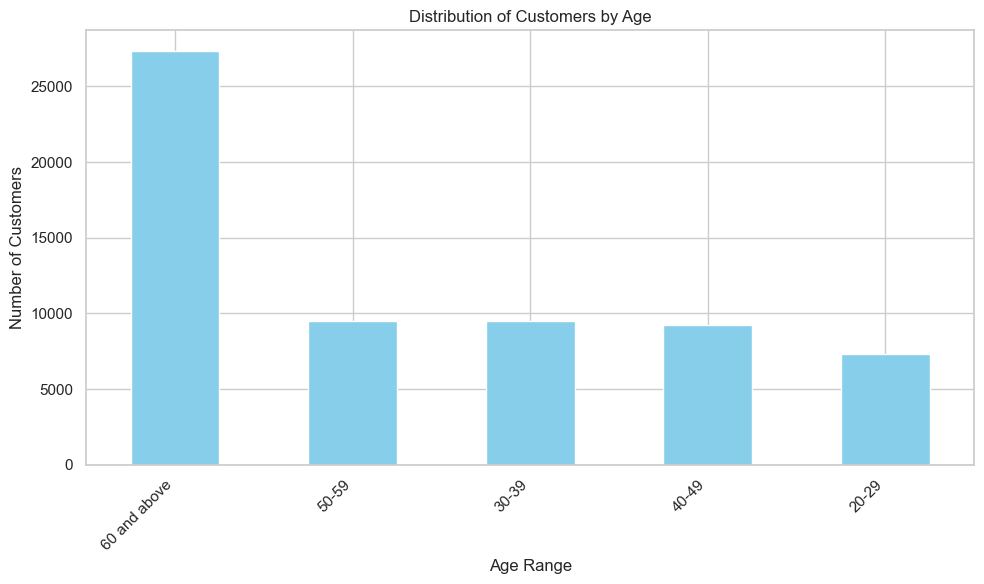

In [73]:
#Seeing Age group as well

ageRange_counts = final_merge_df['AgeRange'].value_counts()

#Plotting distribution of customers by Age
plt.figure(figsize=(10, 6))
ageRange_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Age Range')
plt.ylabel('Number of Customers')
plt.title('Distribution of Customers by Age')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # Adjusts plot to fit labels

# Show plot
plt.show()

60 and Above age customers are the top customer

In [74]:
# Calculating profits by AgeRange
agerange_profits = final_merge_df.groupby(['AgeRange'])['ProfitUSD'].sum().sort_values(ascending=False)
agerange_profits

AgeRange
60 and above    14184413.66
30-39            5051717.71
50-59            4889975.44
40-49            4851787.58
20-29            3684793.99
Name: ProfitUSD, dtype: float64

This shows that aged 60 and above are the major customers.

In [75]:
# Calculating profits by Category
category_profits = final_merge_df.groupby(['Category'])['ProfitUSD'].sum().sort_values(ascending=False)

category_profits

Category
Computers                        11277447.90
Home Appliances                   6296338.85
Cameras and camcorders            3919800.99
TV and Video                      3536694.39
Cell phones                       3498626.54
Music, Movies and Audio Books     1909259.17
Audio                             1827851.77
Games and Toys                     396668.77
Name: ProfitUSD, dtype: float64

Shows that strong demand for techonolgy, entertainment and recreational related products

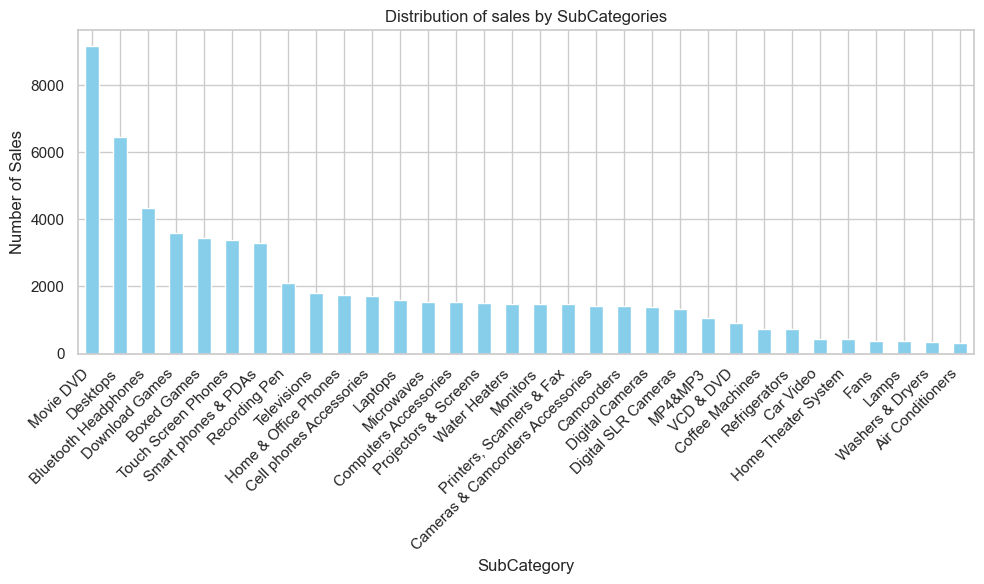

In [76]:
#Distribution of subcategories sold

subcategory_counts = final_merge_df['Subcategory'].value_counts()

#Plotting subcategories and sales
plt.figure(figsize=(10, 6))
subcategory_counts.plot(kind='bar', color='skyblue')
plt.xlabel('SubCategory')
plt.ylabel('Number of Sales')
plt.title('Distribution of sales by SubCategories')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # Adjusts plot to fit labels

# Show plot
plt.show()

In [77]:
# Calculating profits by SubCategory
subcategory_profits = final_merge_df.groupby(['Subcategory'])['ProfitUSD'].sum().sort_values(ascending=False)
subcategory_profits

Subcategory
Desktops                            5629155.33
Televisions                         2631908.38
Projectors & Screens                2357342.37
Water Heaters                       2039982.30
Camcorders                          2018119.70
Movie DVD                           1909259.17
Laptops                             1793677.71
Touch Screen Phones                 1738593.81
Smart phones & PDAs                 1590479.02
Refrigerators                       1316366.73
Washers & Dryers                    1197517.99
Digital SLR Cameras                 1170056.98
Monitors                             950021.49
Bluetooth Headphones                 806865.02
Recording Pen                        741086.69
Coffee Machines                      692610.86
Microwaves                           650954.38
Digital Cameras                      510597.56
Printers, Scanners & Fax             428520.56
Home Theater System                  398020.77
Download Games                       344731.16
C

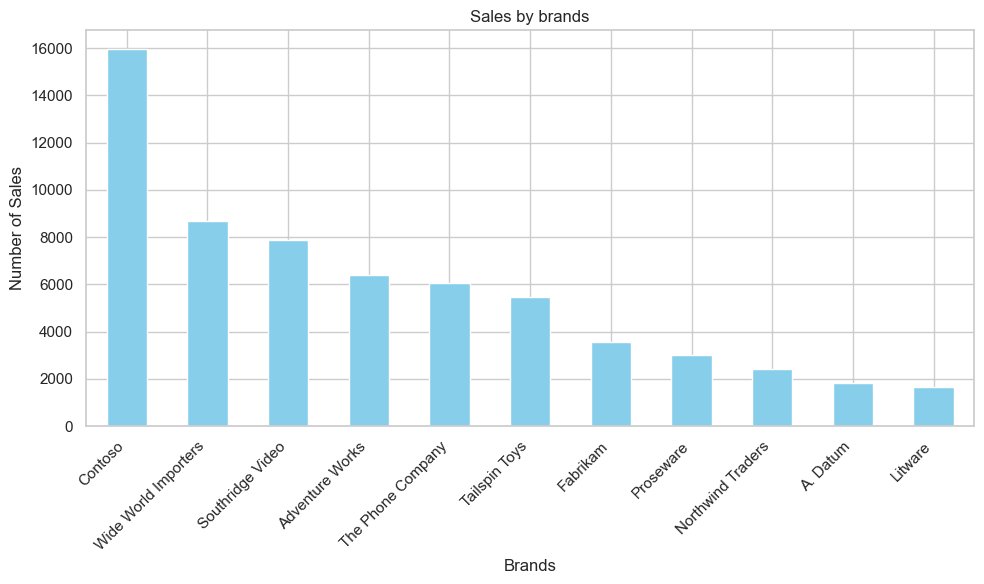

In [78]:
#Distribution of brands sold

brand_counts = final_merge_df['Brand'].value_counts()
#Plotting brands and sales
plt.figure(figsize=(10, 6))
brand_counts.plot(kind='bar', color='skyblue')
plt.xlabel('Brands')
plt.ylabel('Number of Sales')
plt.title('Sales by brands')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # Adjusts plot to fit labels

# Show plot
plt.show()

In [79]:
# Calculating profits by Brands
brand_profits = final_merge_df.groupby(['Brand'])['ProfitUSD'].sum().sort_values(ascending=False)
brand_profits

Brand
Adventure Works         6937318.88
Contoso                 6321209.14
Wide World Importers    5367028.30
Fabrikam                4061475.11
The Phone Company       3057762.90
Proseware               1935287.10
Litware                 1553765.19
Southridge Video        1522876.84
A. Datum                 883502.31
Northwind Traders        649413.31
Tailspin Toys            373049.30
Name: ProfitUSD, dtype: float64

MYSQL CONNECTION

In [117]:
import mysql.connector
conn = mysql.connector.connect(
    host='localhost',
    user='root',
    password=''
)

cursor = conn.cursor()
query = "SHOW DATABASES"


In [119]:
cursor.execute(query)
for x in cursor:
    print(x)

('global_dataspark',)
('information_schema',)
('mysql',)
('performance_schema',)
('phpmyadmin',)
('project_dataspark',)
('redbus',)
('redbus_info',)
('test',)


In [120]:
cursor.execute("USE global_dataspark")

In [121]:
create_table = """CREATE TABLE IF NOT EXISTS Customers(
    CustomerKey INT PRIMARY KEY,
    Gender VARCHAR(10),
    Name VARCHAR(255),
    City VARCHAR(255),
    StateCode VARCHAR(255),
    State VARCHAR(255),
    ZipCode VARCHAR(20),
    Country VARCHAR(100),
    Continent VARCHAR(100),
    Birthday DATE,
    Age INT,
    AgeRange VARCHAR(20))"""

cursor.execute(create_table)

In [122]:
# Iterate over each row in the DataFrame and insert it into the SQL table
for index, row in customers_df.iterrows():
    sql = """INSERT INTO Customers (CustomerKey, Gender, Name, City, StateCode, State, ZipCode, Country, Continent, Birthday, Age, AgeRange)
             VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"""
    cursor.execute(sql, tuple(row))

In [123]:
cursor.execute("SELECT * FROM Customers")
rows = cursor.fetchall()

for row in rows:
    print(row)

(301, 'Female', 'Lilly Harding', 'WANDEARAH EAST', 'SA', 'South Australia', '5523', 'Australia', 'Australia', datetime.date(1939, 7, 3), 85, '60 and above')
(325, 'Female', 'Madison Hull', 'MOUNT BUDD', 'WA', 'Western Australia', '6522', 'Australia', 'Australia', datetime.date(1979, 9, 27), 44, '40-49')
(554, 'Female', 'Claire Ferres', 'WINJALLOK', 'VIC', 'Victoria', '3380', 'Australia', 'Australia', datetime.date(1947, 5, 26), 77, '60 and above')
(786, 'Male', 'Jai Poltpalingada', 'MIDDLE RIVER', 'SA', 'South Australia', '5223', 'Australia', 'Australia', datetime.date(1957, 9, 17), 66, '60 and above')
(1042, 'Male', 'Aidan Pankhurst', 'TAWONGA SOUTH', 'VIC', 'Victoria', '3698', 'Australia', 'Australia', datetime.date(1965, 11, 19), 58, '50-59')
(1086, 'Male', 'Hayden Clegg', 'TEMPLERS', 'SA', 'South Australia', '5371', 'Australia', 'Australia', datetime.date(1954, 1, 20), 70, '60 and above')
(1133, 'Male', 'Nicholas Caffyn', 'JUBILEE POCKET', 'QLD', 'Queensland', '4802', 'Australia', 

In [124]:
create_table_query2 ="""CREATE TABLE IF NOT EXISTS ExchangeRates (
    Date DATE,
    Currency VARCHAR(3),
    Exchange FLOAT,
    PRIMARY KEY (Date, Currency)
)
"""
cursor.execute(create_table_query2)

In [125]:
for index, row in exchange_rates_df.iterrows():
    sql = """INSERT INTO ExchangeRates (Date, Currency, Exchange)
             VALUES (%s, %s, %s)"""
    cursor.execute(sql, tuple(row))

In [126]:
cursor.execute("SELECT * FROM ExchangeRates")
rows = cursor.fetchall()

for row in rows:
    print(row)

(datetime.date(2015, 1, 1), 'AUD', 1.2214)
(datetime.date(2015, 1, 1), 'CAD', 1.1583)
(datetime.date(2015, 1, 1), 'EUR', 0.8237)
(datetime.date(2015, 1, 1), 'GBP', 0.6415)
(datetime.date(2015, 1, 1), 'USD', 1.0)
(datetime.date(2015, 1, 2), 'AUD', 1.2323)
(datetime.date(2015, 1, 2), 'CAD', 1.1682)
(datetime.date(2015, 1, 2), 'EUR', 0.8304)
(datetime.date(2015, 1, 2), 'GBP', 0.6477)
(datetime.date(2015, 1, 2), 'USD', 1.0)
(datetime.date(2015, 1, 3), 'AUD', 1.2323)
(datetime.date(2015, 1, 3), 'CAD', 1.1682)
(datetime.date(2015, 1, 3), 'EUR', 0.8304)
(datetime.date(2015, 1, 3), 'GBP', 0.6477)
(datetime.date(2015, 1, 3), 'USD', 1.0)
(datetime.date(2015, 1, 4), 'AUD', 1.2323)
(datetime.date(2015, 1, 4), 'CAD', 1.1682)
(datetime.date(2015, 1, 4), 'EUR', 0.8304)
(datetime.date(2015, 1, 4), 'GBP', 0.6477)
(datetime.date(2015, 1, 4), 'USD', 1.0)
(datetime.date(2015, 1, 5), 'AUD', 1.2384)
(datetime.date(2015, 1, 5), 'CAD', 1.1784)
(datetime.date(2015, 1, 5), 'EUR', 0.8393)
(datetime.date(2015, 1,

In [127]:
create_table_query3 = """
CREATE TABLE IF NOT EXISTS Products (
    ProductKey INT PRIMARY KEY,
    ProductName VARCHAR(255),
    Brand VARCHAR(100),
    Color VARCHAR(50),
    UnitCostUSD FLOAT,
    UnitPriceUSD FLOAT,
    SubcategoryKey INT,
    Subcategory VARCHAR(255),
    CategoryKey INT,
    Category VARCHAR(255)
)
"""
cursor.execute(create_table_query3)

In [129]:
for index, row in products_df.iterrows():
   sql = """INSERT INTO Products (ProductKey, ProductName, Brand, Color, UnitCostUSD, UnitPriceUSD, SubcategoryKey, Subcategory, CategoryKey, Category)
             VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s)"""
   cursor.execute(sql,tuple(row))
   

In [130]:
cursor.execute("SELECT * FROM Products")
rows = cursor.fetchall()

for row in rows:
    print(row)

(1, 'Contoso 512MB MP3 Player E51 Silver', 'Contoso', 'Silver', 6.62, 12.99, 101, 'MP4&MP3', 1, 'Audio')
(2, 'Contoso 512MB MP3 Player E51 Blue', 'Contoso', 'Blue', 6.62, 12.99, 101, 'MP4&MP3', 1, 'Audio')
(3, 'Contoso 1G MP3 Player E100 White', 'Contoso', 'White', 7.4, 14.52, 101, 'MP4&MP3', 1, 'Audio')
(4, 'Contoso 2G MP3 Player E200 Silver', 'Contoso', 'Silver', 11.0, 21.57, 101, 'MP4&MP3', 1, 'Audio')
(5, 'Contoso 2G MP3 Player E200 Red', 'Contoso', 'Red', 11.0, 21.57, 101, 'MP4&MP3', 1, 'Audio')
(6, 'Contoso 2G MP3 Player E200 Black', 'Contoso', 'Black', 11.0, 21.57, 101, 'MP4&MP3', 1, 'Audio')
(7, 'Contoso 2G MP3 Player E200 Blue', 'Contoso', 'Blue', 11.0, 21.57, 101, 'MP4&MP3', 1, 'Audio')
(8, 'Contoso 4G MP3 Player E400 Silver', 'Contoso', 'Silver', 30.58, 59.99, 101, 'MP4&MP3', 1, 'Audio')
(9, 'Contoso 4G MP3 Player E400 Black', 'Contoso', 'Black', 30.58, 59.99, 101, 'MP4&MP3', 1, 'Audio')
(10, 'Contoso 4G MP3 Player E400 Green', 'Contoso', 'Green', 30.58, 59.99, 101, 'MP4&MP3

In [131]:
create_table_query4 = """
CREATE TABLE IF NOT EXISTS Sales (
    OrderNumber INT,
    LineItem INT,
    OrderDate DATE,
    DeliveryDate DATE,
    CustomerKey INT,
    StoreKey INT,
    ProductKey INT,
    Quantity INT,
    CurrencyCode VARCHAR(10),
    PRIMARY KEY (OrderNumber, LineItem)
)
"""
cursor.execute(create_table_query4)

In [132]:
for index, row in sales_df.iterrows():
    sql = """INSERT INTO Sales (OrderNumber, LineItem, OrderDate, DeliveryDate, CustomerKey, StoreKey, ProductKey, Quantity, CurrencyCode)
             VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s)"""
    cursor.execute(sql,tuple(row))

In [133]:
cursor.execute("SELECT * FROM Sales")
rows = cursor.fetchall()

for row in rows:
    print(row)

(366000, 1, datetime.date(2016, 1, 1), datetime.date(2016, 1, 1), 265598, 10, 1304, 1, 'CAD')
(366001, 1, datetime.date(2016, 1, 1), datetime.date(2016, 1, 13), 1269051, 0, 1048, 2, 'USD')
(366001, 2, datetime.date(2016, 1, 1), datetime.date(2016, 1, 13), 1269051, 0, 2007, 1, 'USD')
(366002, 1, datetime.date(2016, 1, 1), datetime.date(2016, 1, 12), 266019, 0, 1106, 7, 'CAD')
(366002, 2, datetime.date(2016, 1, 1), datetime.date(2016, 1, 12), 266019, 0, 373, 1, 'CAD')
(366002, 3, datetime.date(2016, 1, 1), datetime.date(2016, 1, 12), 266019, 0, 1080, 4, 'CAD')
(366004, 1, datetime.date(2016, 1, 1), datetime.date(2016, 1, 1), 1107461, 38, 163, 6, 'GBP')
(366004, 2, datetime.date(2016, 1, 1), datetime.date(2016, 1, 1), 1107461, 38, 1529, 2, 'GBP')
(366005, 1, datetime.date(2016, 1, 1), datetime.date(2016, 1, 1), 844003, 33, 421, 4, 'EUR')
(366007, 1, datetime.date(2016, 1, 1), datetime.date(2016, 1, 1), 2035771, 43, 1617, 1, 'USD')
(366007, 2, datetime.date(2016, 1, 1), datetime.date(2016,

In [140]:
cursor.execute("DROP TABLE Stores")

In [141]:
create_table_query5 = """
CREATE TABLE IF NOT EXISTS Stores (
    StoreKey INT PRIMARY KEY,
    Country VARCHAR(100),
    State VARCHAR(100),
    SquareMeters FLOAT,
    OpenDate DATE,
    StoreAge INT

)
"""
cursor.execute(create_table_query5)

In [144]:
for index, row in stores_df.iterrows():
    sql = """INSERT INTO Stores (StoreKey, Country, State, SquareMeters, OpenDate, StoreAge)
             VALUES (%s, %s, %s, %s, %s,%s)"""
    cursor.execute(sql,tuple(row))

In [145]:
cursor.execute("SELECT * FROM Stores")
rows = cursor.fetchall()

for row in rows:
    print(row)

(0, 'Online', 'Online', 0.0, datetime.date(2010, 1, 1), 14)
(1, 'Australia', 'Australian Capital Territory', 595.0, datetime.date(2008, 1, 1), 16)
(2, 'Australia', 'Northern Territory', 665.0, datetime.date(2008, 1, 12), 16)
(3, 'Australia', 'South Australia', 2000.0, datetime.date(2012, 1, 7), 12)
(4, 'Australia', 'Tasmania', 2000.0, datetime.date(2010, 1, 1), 14)
(5, 'Australia', 'Victoria', 2000.0, datetime.date(2015, 12, 9), 8)
(6, 'Australia', 'Western Australia', 2000.0, datetime.date(2010, 1, 1), 14)
(7, 'Canada', 'New Brunswick', 1105.0, datetime.date(2007, 5, 7), 17)
(8, 'Canada', 'Newfoundland and Labrador', 2105.0, datetime.date(2014, 7, 2), 10)
(9, 'Canada', 'Northwest Territories', 1500.0, datetime.date(2005, 3, 4), 19)
(10, 'Canada', 'Nunavut', 1210.0, datetime.date(2015, 4, 4), 9)
(11, 'Canada', 'Yukon', 1210.0, datetime.date(2009, 6, 3), 15)
(12, 'France', 'Basse-Normandie', 350.0, datetime.date(2012, 6, 6), 12)
(13, 'France', 'Corse', 245.0, datetime.date(2013, 6, 7), 